# CellDART Example Code: mouse brain 
## (10x Visium of anterior mouse brain + scRNA-seq data of mouse brain)

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from CellDART import da_cellfraction
from CellDART.utils import random_mix
from sklearn.manifold import TSNE

Using TensorFlow backend.
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home

## 1. Data load
### load scanpy data - 10x datasets

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

adata_spatial_anterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Anterior"
)
adata_spatial_posterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Posterior"
)

#Normalize
for adata in [
    adata_spatial_anterior,
    adata_spatial_posterior,
]:
    sc.pp.normalize_total(adata, inplace=True)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.6 numpy==1.17.0 scipy==1.5.1 pandas==0.25.0 scikit-learn==0.21.2 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1
reading /home/user/Data1/Data/Spatial10xdata/Tmp_Scanpy/LabelTransfer_DA/data/V1_Mouse_Brain_Sagittal_Anterior/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /home/user/Data1/Data/Spatial10xdata/Tmp_Scanpy/LabelTransfer_DA/data/V1_Mouse_Brain_Sagittal_Posterior/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


### Single cell Data: GSE115746 
 - Download from GEO and use two files "GSE115746_cells_exon_counts.csv" and "GSE115746_complete_metadata_28706-cells.csv"

In [3]:
adata_cortex = sc.read_csv('../data/GSE115746_cells_exon_counts.csv').T
adata_cortex_meta = pd.read_csv('../data/GSE115746_complete_metadata_28706-cells.csv', index_col=0)
adata_cortex_meta_ = adata_cortex_meta.loc[adata_cortex.obs.index,]

adata_cortex.obs = adata_cortex_meta_
adata_cortex.var_names_make_unique()  


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:43)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


... storing 'source_name' as categorical
... storing 'organism' as categorical
... storing 'donor_id' as categorical
... storing 'donor_sex' as categorical
... storing 'donor_genotype' as categorical
... storing 'injection_type' as categorical
... storing 'injection_target' as categorical
... storing 'injected_material' as categorical
... storing 'dissected_region' as categorical
... storing 'dissected_layer' as categorical
... storing 'facs_gating' as categorical
... storing 'facs_date' as categorical
... storing 'rna_amplification_set' as categorical
... storing 'sequencing_tube' as categorical
... storing 'sequencing_batch' as categorical
... storing 'sequencing_qc_pass_fail' as categorical
... storing 'cell_class' as categorical
... storing 'cell_subclass' as categorical
... storing 'cell_cluster' as categorical
... storing 'molecule' as categorical
... storing 'GEO_Sample' as categorical
... storing 'GEO_Sample_Title' as categorical


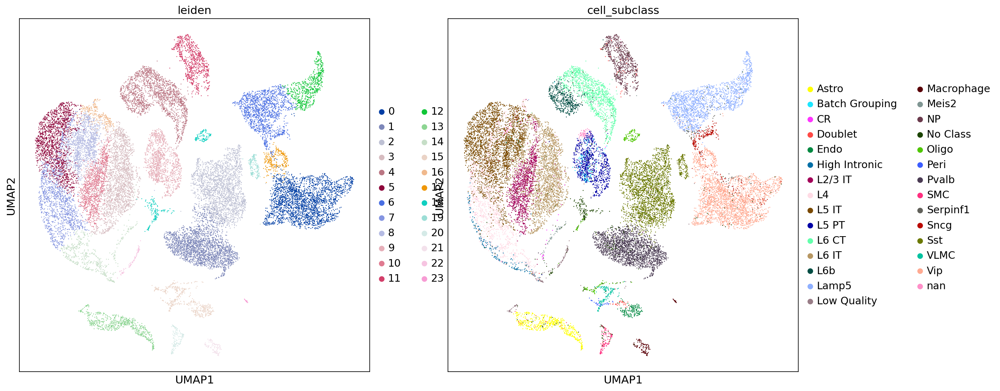

In [4]:
#Preprocessing
adata_cortex.var['mt'] = adata_cortex.var_names.str.startswith('Mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_cortex, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pp.normalize_total(adata_cortex)

#PCA and clustering : Known markers with 'cell_subclass'
sc.tl.pca(adata_cortex, svd_solver='arpack')
sc.pp.neighbors(adata_cortex, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_cortex)
sc.tl.leiden(adata_cortex, resolution = 0.5)
sc.pl.umap(adata_cortex, color=['leiden','cell_subclass'])


ranking genes


/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:413: RuntimeWarning: overflow encountered in expm1
  foldchanges = (expm1_func(means[imask]) + 1e-9) / (expm1_func(mean_rest) + 1e-9)  # add small value to remove 0's
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:413: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (expm1_func(means[imask]) + 1e-9) / (expm1_func(mean_rest) + 1e-9)  # add small value to remove 0's


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:57)


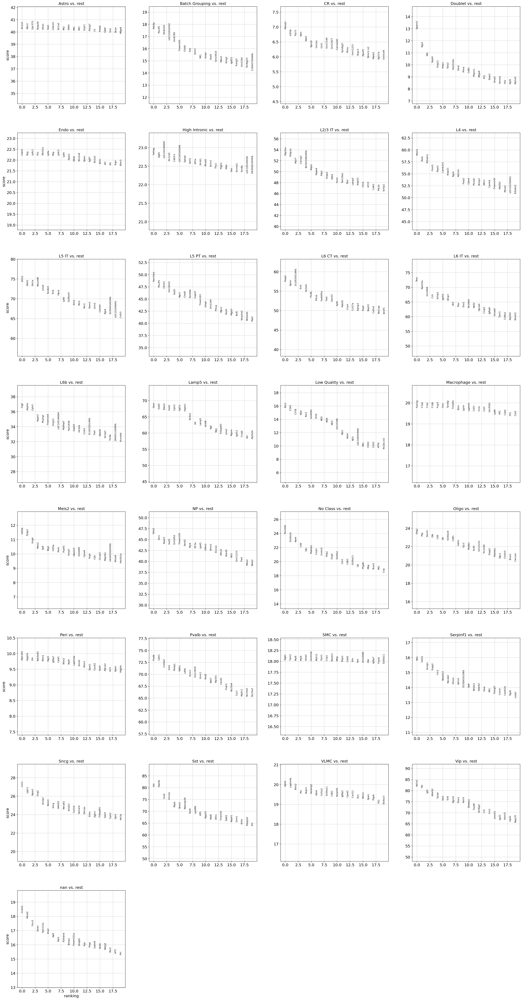

In [5]:
sc.tl.rank_genes_groups(adata_cortex, 'cell_subclass', method='wilcoxon')
sc.pl.rank_genes_groups(adata_cortex, n_genes=20, sharey=False)

In [6]:
genelists=adata_cortex.uns['rank_genes_groups']['names']
df_genelists = pd.DataFrame.from_records(genelists)
df_genelists.head(5)

,Astro,Batch Grouping,CR,Doublet,Endo,High Intronic,L2/3 IT,L4,L5 IT,L5 PT,...,Oligo,Peri,Pvalb,SMC,Serpinf1,Sncg,Sst,VLMC,Vip,nan
0,Slc1a3,Sdcbp,Ramp1,Sparcl1,Cldn5,Ywhag,Ppp3ca,Nrxn1,Krt12,Fam19a1,...,Olig1,Atp13a5,Pvalb,Tagln,Nov,Cnr1,Sst,Apod,Ap1s2,Cx3cl1
1,Ntsr2,Pou3f1,H3f3b,Rgs5,Bsg,Dgkh,Fkbp1a,Rorb,Dkkl1,Pou3f1,...,Pllp,Higd1b,Cplx1,Tpm2,Gsto1,Lppr1,Rab3b,Laptm4a,Vip,Mical2
2,Gpr37l1,Serpine2,Trp73,Wls,Ly6c1,LOC105246694,Myh7,R3hdm1,Stx1a,Ckmt1,...,Sox10,Vtn,Cox6a2,Myl6,Kcnip1,Npas1,Lhx6,Ifitm2,Igf1,Fscn1
3,Ppap2b,LOC102634502,Reln,Sept4,Flt1,Slc12a5,Cacng3,Fmnl1,Neurod6,Gm19410,...,Dbi,Ndufa4l2,Got1,Myl9,Enpp2,Gng2,Grin3a,Ptn,Adarb2,Dmtn
4,Htra1,Gm6789,Ndnf,Gng12,Abcb1a,Cdk5r1,B230216N24Rik,Rspo1,Lmo4,Fezf2,...,Cd9,Ifitm1,Phlda1,Acta2,Cnr1,Kcnip1,Rbp4,Nupr1,Synpr,Fam131a


In [24]:
num_markers=10
res_genes = []
for column in df_genelists.head(num_markers): 
    res_genes.extend(df_genelists.head(num_markers)[column].tolist())
res_genes_ = list(set(res_genes))

### Select same gene features 

In [25]:
adata_spatial_anterior.var_names_make_unique() 
inter_genes = [val for val in res_genes_ if val in adata_spatial_anterior.var.index]
print('Selected Feature Gene number',len(inter_genes))
adata_cortex = adata_cortex[:,inter_genes]

adata_spatial_anterior = adata_spatial_anterior[:,inter_genes]


Selected Feature Gene number 242


### Array of single cell & spatial data
- Single cell data with labels
- Spatial data without labels


In [26]:
mat_sc = adata_cortex.X
mat_sp = adata_spatial_anterior.X.todense()

df_sc = adata_cortex.obs

lab_sc_sub = df_sc.cell_subclass
sc_sub_dict = dict(zip(range(len(set(lab_sc_sub))), set(lab_sc_sub)))
sc_sub_dict2 = dict((y,x) for x,y in sc_sub_dict.items())
lab_sc_num = [sc_sub_dict2[ii] for ii in lab_sc_sub]
lab_sc_num = np.asarray(lab_sc_num, dtype='int')

## 2. Generate mixture from single cell data and preprocessing

In [27]:
sc_mix, lab_mix = random_mix(mat_sc, lab_sc_num, nmix=5, n_samples=5000)

def log_minmaxscale(arr):
    arrd = len(arr)
    arr = np.log1p(arr)
    return (arr-np.reshape(np.min(arr,axis=1), (arrd,1)))/np.reshape((np.max(arr, axis=1)-np.min(arr,axis=1)),(arrd,1))

sc_mix_s = log_minmaxscale(sc_mix)
mat_sp_s = log_minmaxscale(mat_sp)
mat_sc_s = log_minmaxscale(mat_sc)


In [28]:
print(mat_sp_s.shape, mat_sc_s.shape, sc_mix_s.shape)

(2696, 242) (23178, 242) (5000, 242)


## 3. Training: Adversarial domain adaptation for cell fraction estimation
### Parameters
- alpha: loss weights for adversarial learning for pooling domain classifier
- alpha_lr: learning rate for training domain classifier  (alpha_lr *0.001)
- emb_dim: embedding dimension (feature dimension)
- batch_size : batch size for the training
- n_iterations: iteration number of adversarial training
- initial_train: if true, classifier model is trained firstly before adversarial domain adaptation
- initial_train_epochs: number of epochs for inital training



In [ ]:
embs, clssmodel = da_cellfraction.train(sc_mix_s, lab_mix, mat_sp_s, 
                                        alpha=1, alpha_lr=5, emb_dim = 64, batch_size = 512,
                                        n_iterations = 2000,
                                        initial_train=True,
                                        initial_train_epochs=10)

Epoch 1/10
5000/5000 [==============================] - 1s 170us/step - loss: 1.2636 - mean_absolute_error: 0.0400
Epoch 2/10
5000/5000 [==============================] - 0s 6us/step - loss: 0.6982 - mean_absolute_error: 0.0279
Epoch 3/10
5000/5000 [==============================] - 0s 7us/step - loss: 0.5857 - mean_absolute_error: 0.0245
Epoch 4/10
5000/5000 [==============================] - 0s 7us/step - loss: 0.5229 - mean_absolute_error: 0.0227
Epoch 5/10
5000/5000 [==============================] - 0s 7us/step - loss: 0.4749 - mean_absolute_error: 0.0212
Epoch 6/10
5000/5000 [==============================] - 0s 6us/step - loss: 0.4372 - mean_absolute_error: 0.0201
Epoch 7/10
5000/5000 [==============================] - 0s 6us/step - loss: 0.4079 - mean_absolute_error: 0.0193
Epoch 8/10
5000/5000 [==============================] - 0s 7us/step - loss: 0.3845 - mean_absolute_error: 0.0186
Epoch 9/10
5000/5000 [==============================] - 0s 7us/step - loss: 0.3631 - mean_abso

## 4. Predict cell fraction of spots and visualization

In [30]:
pred_sp = clssmodel.predict(mat_sp_s)

def plot_cellfraction(visnum):
    adata_spatial_anterior.obs['Pred_label'] = pred_sp[:,visnum]
    sc.pl.spatial(
        adata_spatial_anterior,
        img_key="hires",
        color='Pred_label',
        palette='Set1',
        size=1.5,
        legend_loc=None,
        title = sc_sub_dict[visnum])

print(sc_sub_dict)


{0: 'Doublet', 1: 'No Class', 2: 'L2/3 IT', 3: 'L4', 4: 'NP', 5: 'Astro', 6: 'Sst', 7: 'L5 IT', 8: 'L5 PT', 9: 'Vip', 10: 'SMC', 11: 'Macrophage', 12: 'L6b', 13: 'L6 CT', 14: 'Endo', 15: 'High Intronic', 16: 'Lamp5', 17: 'Meis2', 18: 'L6 IT', 19: 'Sncg', 20: 'Oligo', 21: 'nan', 22: 'Batch Grouping', 23: 'Serpinf1', 24: 'Peri', 25: 'CR', 26: 'Pvalb', 27: 'Low Quality', 28: 'VLMC'}


Trying to set attribute `.obs` of view, copying.


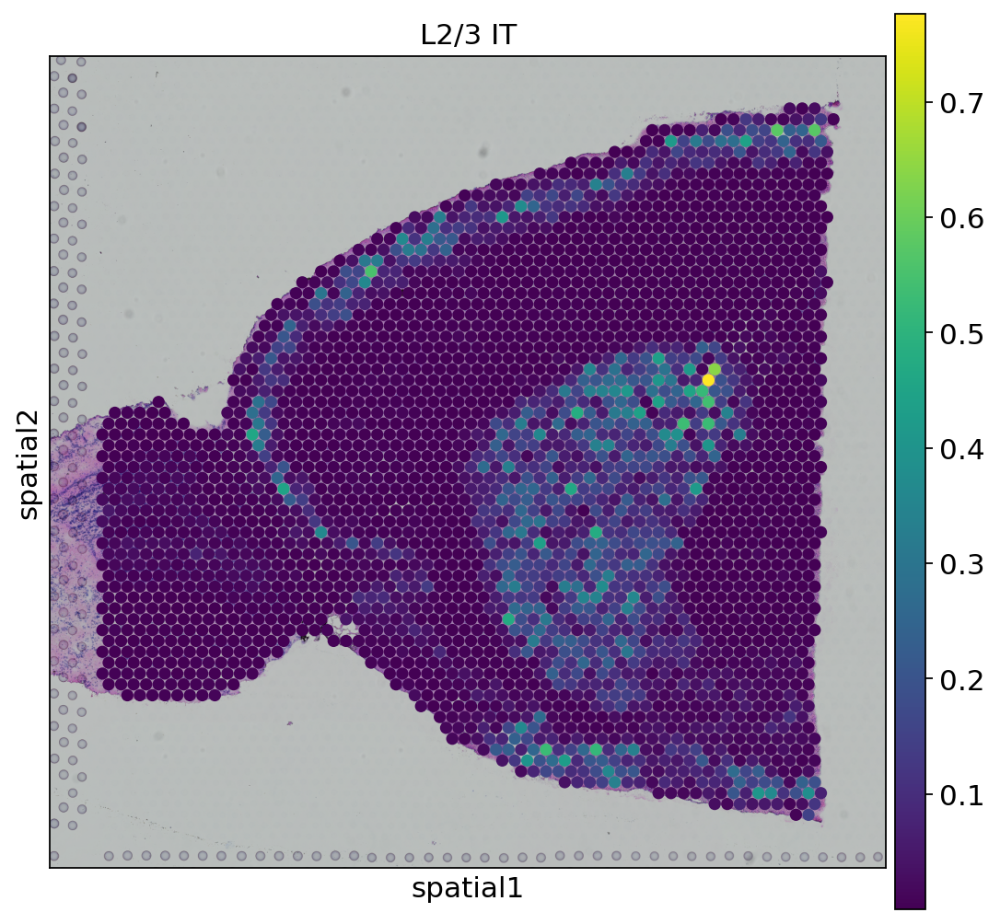

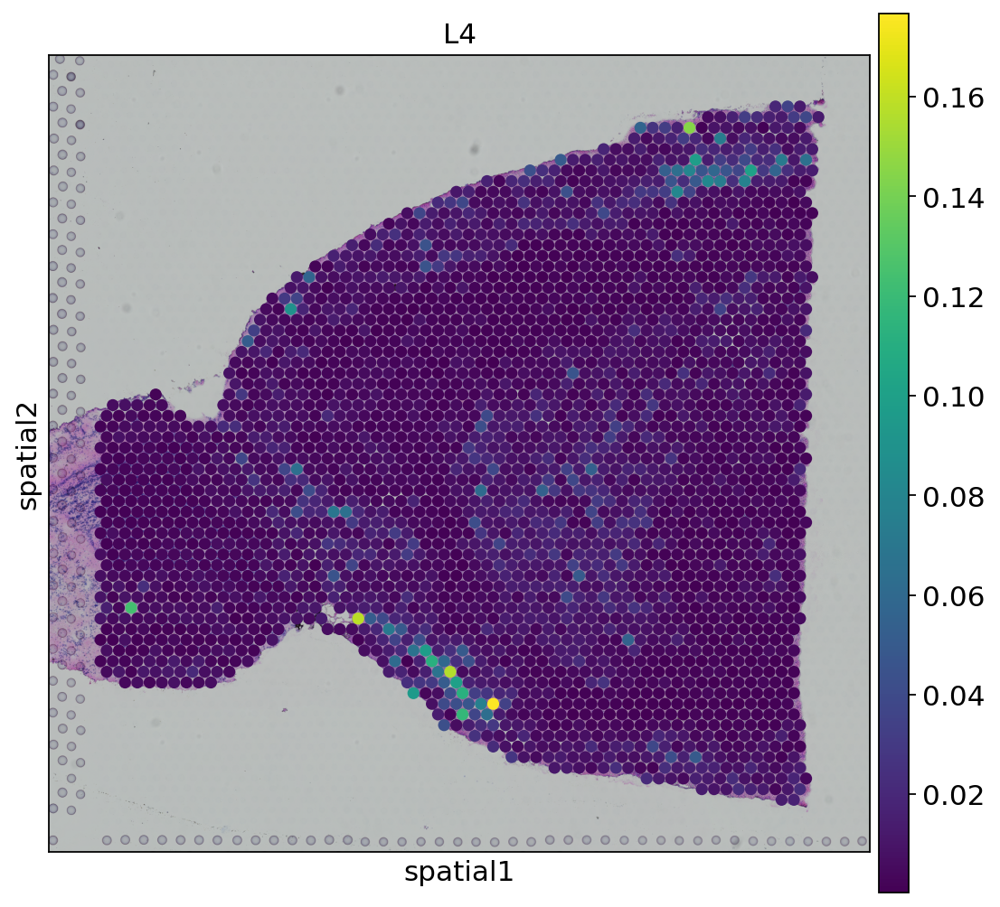

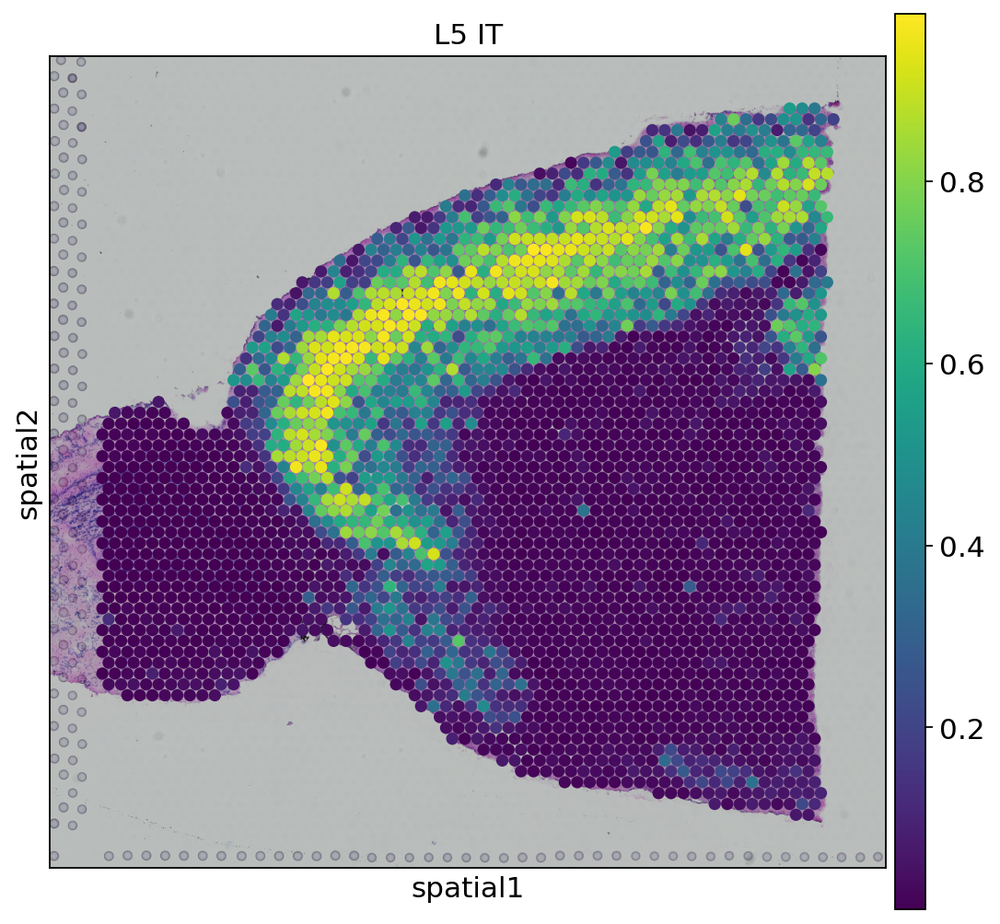

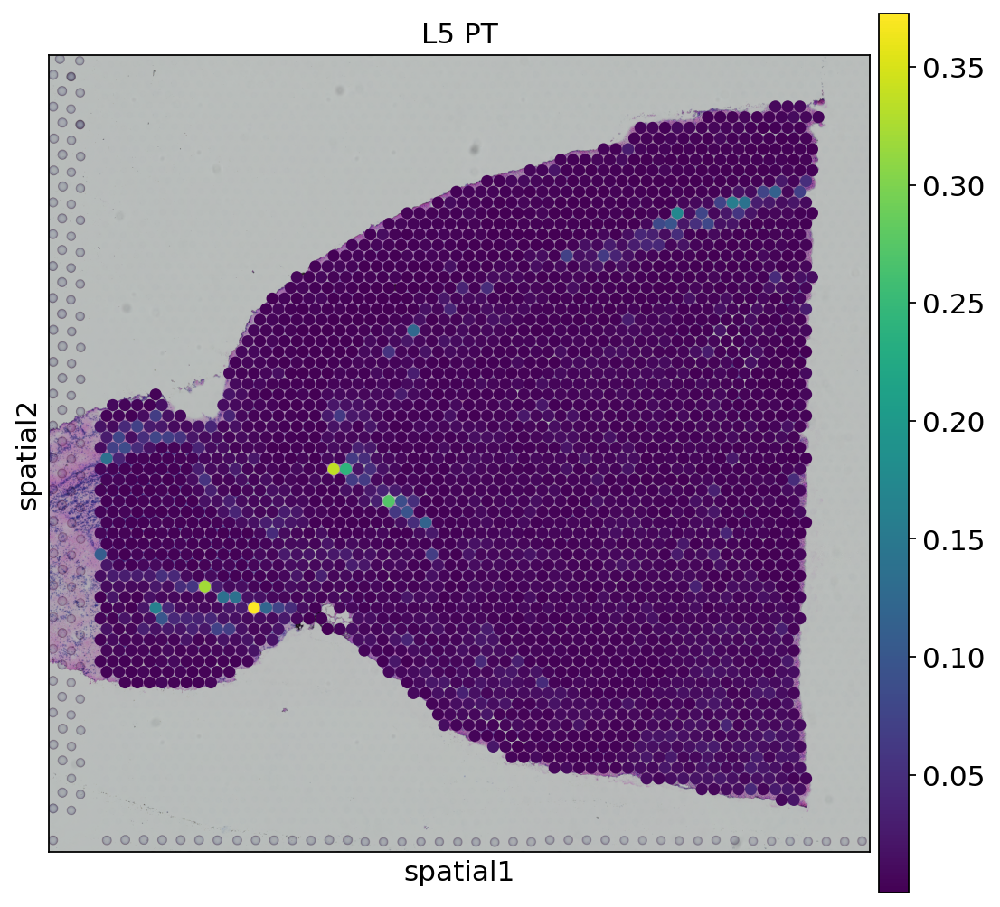

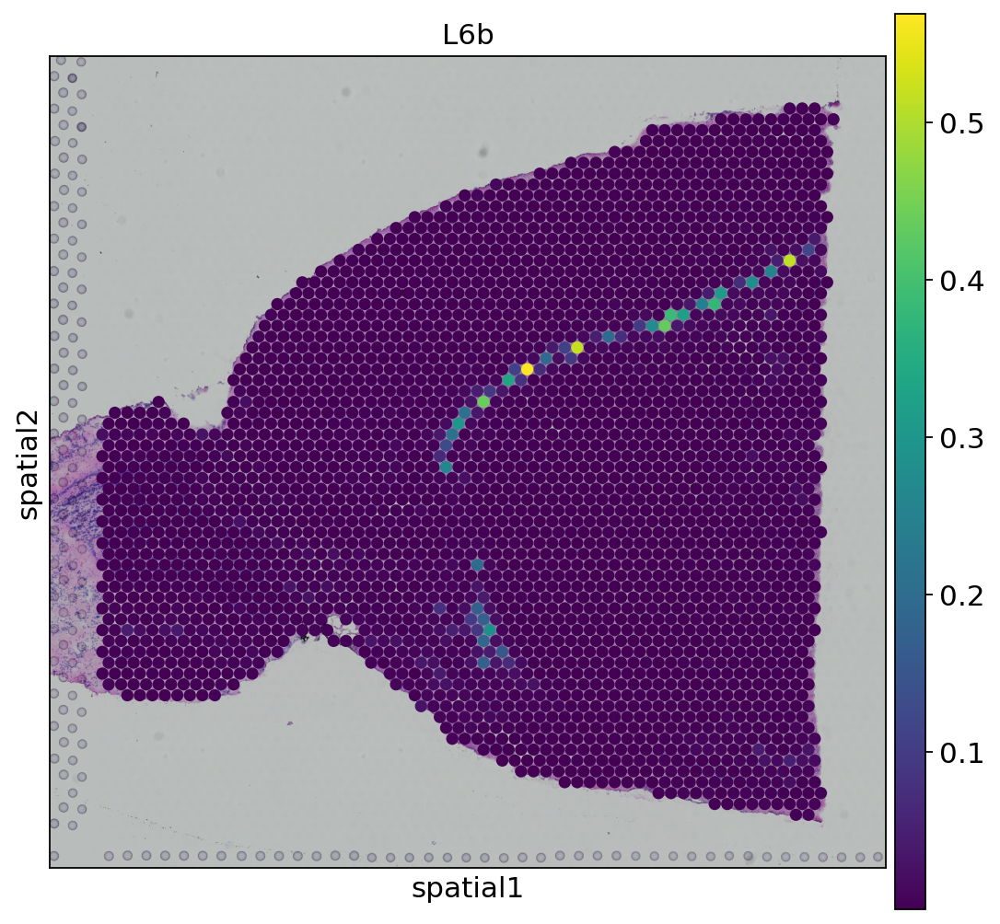

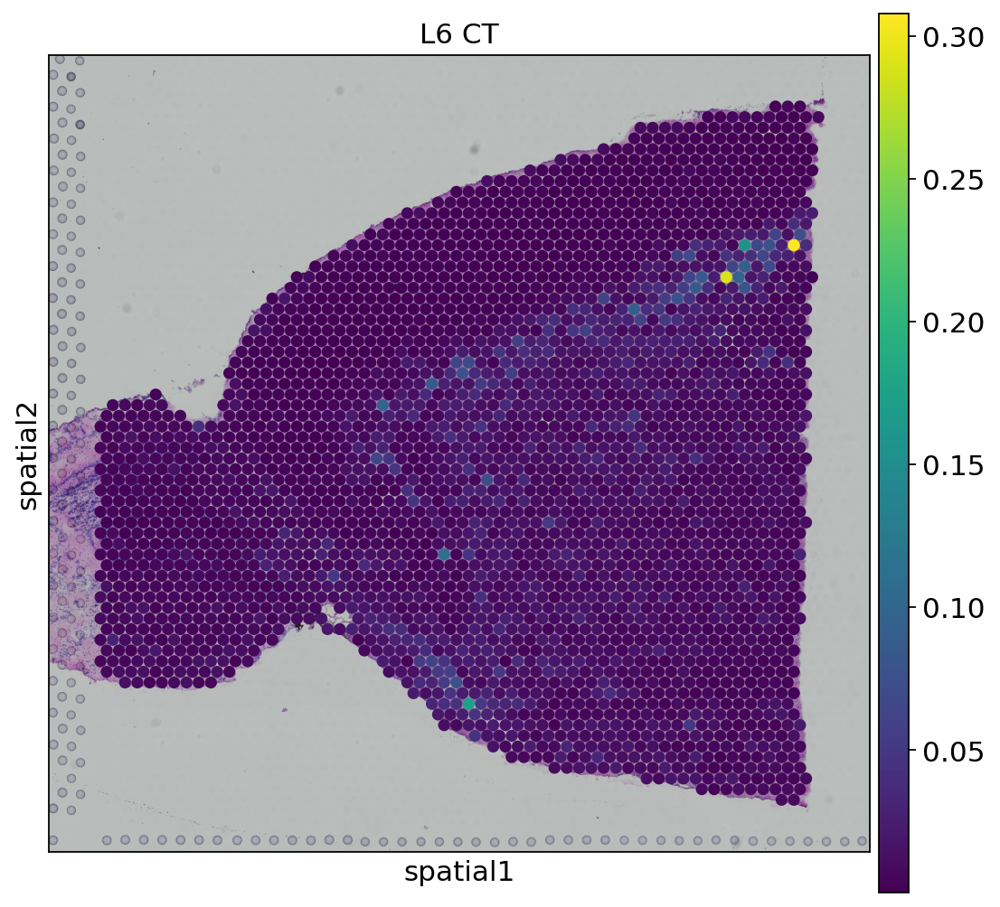

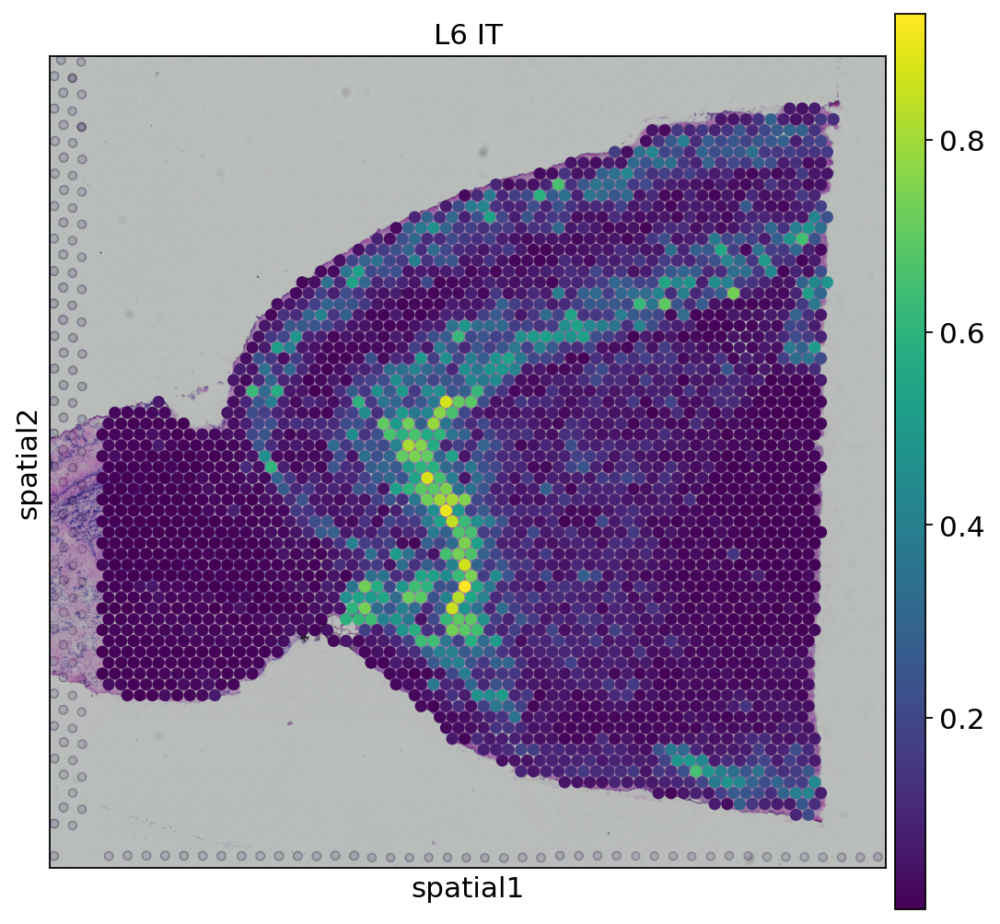

In [31]:
numlist = [2,3,7,8,12,13,18]

for num in numlist:
    plot_cellfraction(num)

- cf. Prediction of Mixture (pseudospots)


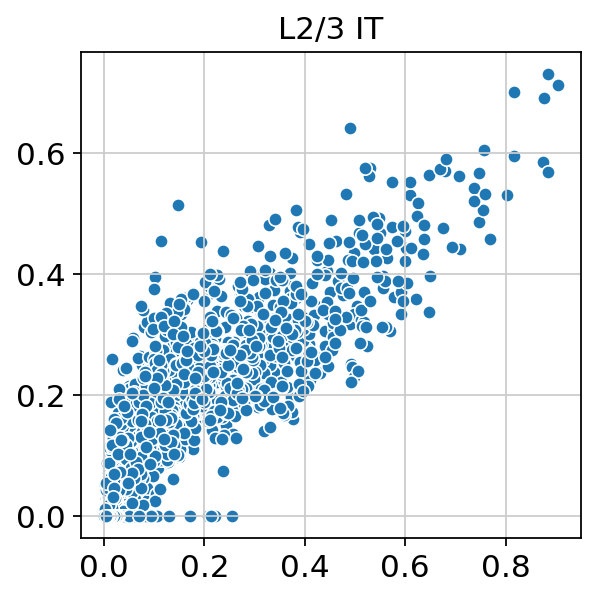

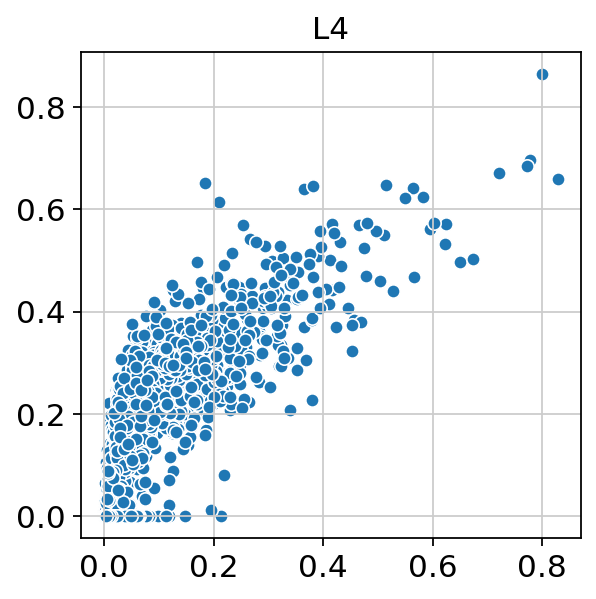

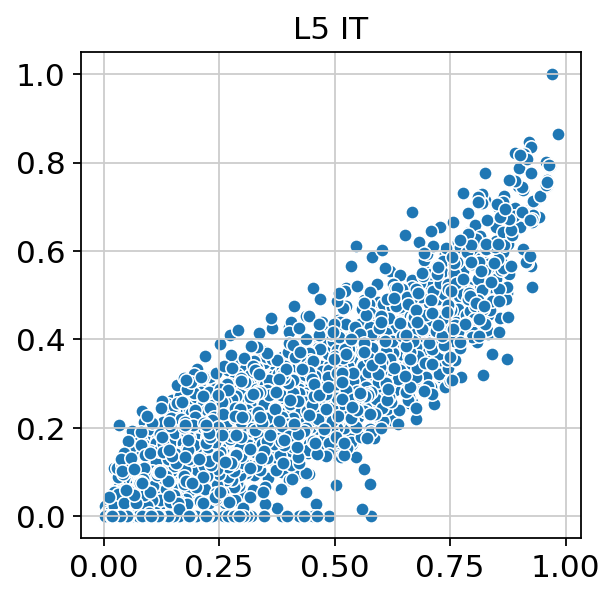

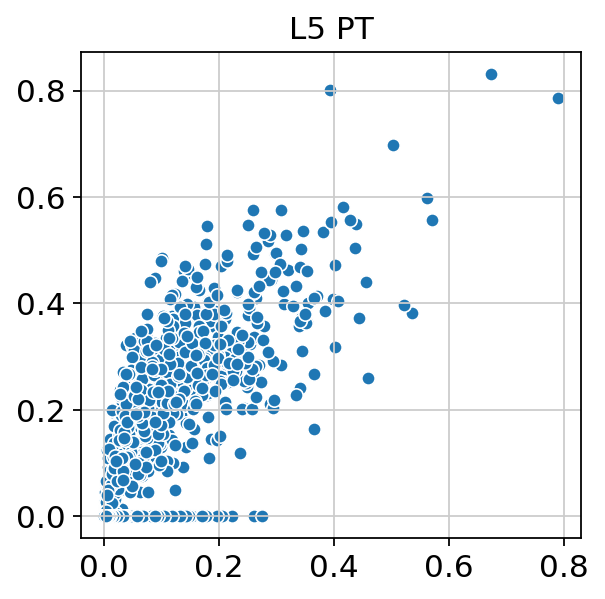

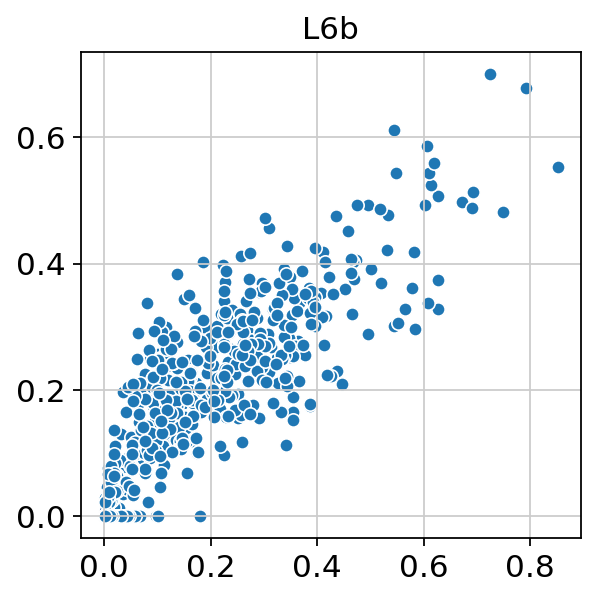

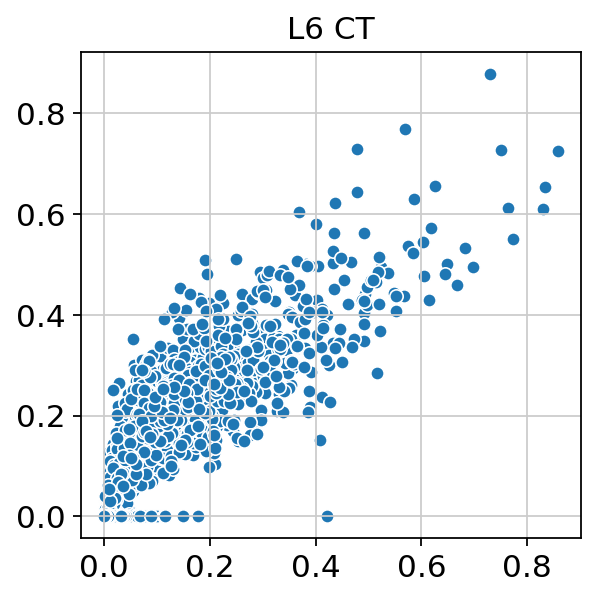

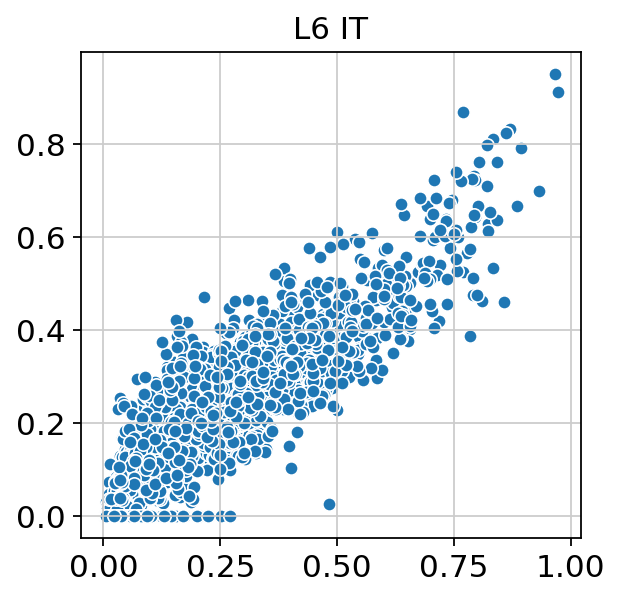

In [16]:
pred_mix = clssmodel.predict(sc_mix_s)

for visnum in numlist:
    plt.figure(figsize=(4,4))
    sns.scatterplot(pred_mix[:,visnum], lab_mix[:,visnum]).set_title(sc_sub_dict[visnum])
    plt.show()

In [22]:

print('\n'.join(f'{m.__name__} {m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

json 2.0.9
numpy 1.17.0
pandas 0.25.0
tensorflow 1.14.0
ipywidgets 7.5.1
scanpy 1.5.1
pandas 0.25.0
numpy 1.17.0
seaborn 0.10.1
pip 19.2.1


In [23]:
import keras
keras.__version__

'2.2.4'